In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2
from PIL import Image
from tqdm import tqdm

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split
import torchvision.transforms as transforms
from torchvision import models
from torchmetrics.segmentation import MeanIoU
from UNet import UNet, UNetNoSkip, UNetRes, UNetGate


In [2]:
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
NUM_CLASSES = 13
BATCH_SIZE = 8
LR = 1e-4
EPOCHS = 50
IMG_SIZE = (256, 256)

In [3]:
# Custom Dataset class
class SegmentationDataset(Dataset):
    def __init__(self, image_dir, mask_dir, transform=None):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.transform = transform
        self.images = os.listdir(image_dir)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = os.path.join(self.image_dir, self.images[idx])
        mask_path = os.path.join(self.mask_dir, self.images[idx])

        # Read image and mask
        image = Image.open(img_path).convert("RGB")
        mask = Image.open(mask_path).convert("L")  # Grayscale
        
        # Resize to target dimensions
        image = image.resize(IMG_SIZE)
        mask = mask.resize(IMG_SIZE)
        
        # Apply transforms
        if self.transform:
            image = self.transform(image)
        
        # Convert mask to tensor without normalization
        mask = torch.from_numpy(np.array(mask)).long()
        
        return image, mask

In [4]:
image_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])


In [5]:
# Create datasets
train_dataset = SegmentationDataset(
    './dataset_256/train/images',
    './dataset_256/train/labels',
    transform=image_transform
)

val_size = int(0.2 * len(train_dataset))
train_size = len(train_dataset) - val_size
train_data, val_data = random_split(train_dataset, [train_size, val_size])

test_data = SegmentationDataset(
    './dataset_256/test/images',
    './dataset_256/test/labels',
    transform=image_transform
)


In [6]:
train_loader = DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_data, batch_size=BATCH_SIZE, shuffle=False)
test_loader = DataLoader(test_data, batch_size=BATCH_SIZE, shuffle=False)


In [7]:
def train_model(model, criterion, optimizer, n_epochs):
    train_losses = []
    val_losses = []
    train_ious = []
    val_ious = []
    best_val_iou = 0
    
    # Create metric and move it to the same device as model
    metric = MeanIoU(num_classes=NUM_CLASSES).to(DEVICE)
    
    for epoch in range(n_epochs):
        # Training phase
        model.train()
        train_loss = 0
        train_iou = 0
        train_steps = 0
        
        for images, masks in tqdm(train_loader, desc=f'Epoch {epoch+1}/{n_epochs} - Training'):
            images = images.to(DEVICE)
            masks = masks.to(DEVICE)
            
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()
            
            train_loss += loss.item()
            preds = torch.argmax(outputs, dim=1)
            train_iou += metric(preds, masks).item()
            train_steps += 1
        
        avg_train_loss = train_loss / train_steps
        avg_train_iou = train_iou / train_steps
        train_losses.append(avg_train_loss)
        train_ious.append(avg_train_iou)
        
        # Validation phase
        model.eval()
        val_loss = 0
        val_iou = 0
        val_steps = 0
        
        with torch.no_grad():
            for images, masks in tqdm(val_loader, desc=f'Epoch {epoch+1}/{n_epochs} - Validation'):
                images = images.to(DEVICE)
                masks = masks.to(DEVICE)
                
                outputs = model(images)
                loss = criterion(outputs, masks)
                
                val_loss += loss.item()
                preds = torch.argmax(outputs, dim=1)
                val_iou += metric(preds, masks).item()
                val_steps += 1
        
        avg_val_loss = val_loss / val_steps
        avg_val_iou = val_iou / val_steps
        val_losses.append(avg_val_loss)
        val_ious.append(avg_val_iou)
        
        print(f'Epoch {epoch+1}/{n_epochs} - Train Loss: {avg_train_loss:.4f}, Train mIoU: {avg_train_iou:.4f}, Val Loss: {avg_val_loss:.4f}, Val mIoU: {avg_val_iou:.4f}')
        
        # Save the best model
        if avg_val_iou > best_val_iou:
            best_val_iou = avg_val_iou
            torch.save(model.state_dict(), f'best_model_{model.__class__.__name__}.pth')
    
    return train_losses, val_losses, train_ious, val_ious


In [8]:
def evaluate_model(model, loader):
    model.eval()
    # Create metric and move it to the same device as model
    metric = MeanIoU(num_classes=NUM_CLASSES).to(DEVICE)
    total_iou = 0
    steps = 0
    
    with torch.no_grad():
        for images, masks in tqdm(loader, desc='Evaluating'):
            images = images.to(DEVICE)
            masks = masks.to(DEVICE)
            
            outputs = model(images)
            preds = torch.argmax(outputs, dim=1)
            total_iou += metric(preds, masks).item()
            steps += 1
    
    avg_iou = total_iou / steps
    print(f'Test mIoU: {avg_iou:.4f}')
    return avg_iou


In [9]:
# Visualization function
def visualize_predictions(model, loader, num_samples=5):
    model.eval()
    fig, axes = plt.subplots(num_samples, 3, figsize=(15, num_samples * 5))
    
    if num_samples == 1:
        axes = axes.reshape(1, -1)
    
    # Function to denormalize images for visualization
    def denorm(tensor):
        tensor = tensor.clone().detach()
        mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1).to(tensor.device)
        std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1).to(tensor.device)
        tensor = tensor * std + mean
        tensor = tensor.clamp(0, 1)
        return tensor
    
    with torch.no_grad():
        for i, (images, masks) in enumerate(loader):
            if i >= num_samples:
                break
            
            images = images.to(DEVICE)
            masks = masks.to(DEVICE)
            
            outputs = model(images)
            preds = torch.argmax(outputs, dim=1)
            
            # Convert back to numpy for visualization
            image_np = denorm(images[0]).cpu().permute(1, 2, 0).numpy()
            
            mask_np = masks[0].cpu().numpy()
            pred_np = preds[0].cpu().numpy()
            
            # Plot
            axes[i, 0].imshow(image_np)
            axes[i, 0].set_title("Input Image")
            axes[i, 0].axis('off')
            
            axes[i, 1].imshow(mask_np, cmap='tab20', vmin=0, vmax=NUM_CLASSES-1)
            axes[i, 1].set_title("Ground Truth Mask")
            axes[i, 1].axis('off')
            
            axes[i, 2].imshow(pred_np, cmap='tab20', vmin=0, vmax=NUM_CLASSES-1)
            axes[i, 2].set_title("Predicted Mask")
            axes[i, 2].axis('off')
    
    plt.tight_layout()
    plt.savefig(f"predictions_{model.__class__.__name__}.png")
    plt.show()


In [10]:
def visualize_dataset_samples(loader, num_samples=5):
    fig, axes = plt.subplots(num_samples, 2, figsize=(10, num_samples * 5))
    
    if num_samples == 1:
        axes = axes.reshape(1, -1)
    
    denorm = transforms.Compose([
        transforms.Normalize(mean=[0, 0, 0], std=[1/0.229, 1/0.224, 1/0.225]),
        transforms.Normalize(mean=[-0.485, -0.456, -0.406], std=[1, 1, 1]),
    ])
    
    for i, (images, masks) in enumerate(loader):
        if i >= num_samples:
            break
        
        # Convert back to numpy for visualization
        image_np = denorm(images[0]).cpu().permute(1, 2, 0).numpy()
        image_np = np.clip(image_np, 0, 1)
        
        mask_np = masks[0].cpu().numpy()
        
        # Plot
        axes[i, 0].imshow(image_np)
        axes[i, 0].set_title("Image")
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(mask_np, cmap='tab20', vmin=0, vmax=NUM_CLASSES-1)
        axes[i, 1].set_title("Segmentation Mask")
        axes[i, 1].axis('off')
    
    plt.tight_layout()
    plt.savefig("dataset_samples.png")
    plt.show()

# Plot learning curves
def plot_learning_curves(train_losses, val_losses, train_ious, val_ious, model_name):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
    
    ax1.plot(train_losses, label='Train Loss')
    ax1.plot(val_losses, label='Validation Loss')
    ax1.set_xlabel('Epochs')
    ax1.set_ylabel('Loss')
    ax1.set_title(f'{model_name} - Loss Curves')
    ax1.legend()
    ax1.grid(True)
    
    ax2.plot(train_ious, label='Train mIoU')
    ax2.plot(val_ious, label='Validation mIoU')
    ax2.set_xlabel('Epochs')
    ax2.set_ylabel('mIoU')
    ax2.set_title(f'{model_name} - mIoU Curves')
    ax2.legend()
    ax2.grid(True)
    
    plt.tight_layout()
    plt.savefig(f"learning_curves_{model_name}.png")
    plt.show()

# Visualize dataset samples
def visualize_dataset_samples(loader, num_samples=5):
    fig, axes = plt.subplots(num_samples, 2, figsize=(10, num_samples * 5))
    
    if num_samples == 1:
        axes = axes.reshape(1, -1)
    
    # Function to denormalize images for visualization
    def denorm(tensor):
        tensor = tensor.clone().detach()
        mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1).to(tensor.device)
        std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1).to(tensor.device)
        tensor = tensor * std + mean
        tensor = tensor.clamp(0, 1)
        return tensor
    
    for i, (images, masks) in enumerate(loader):
        if i >= num_samples:
            break
        
        # Convert back to numpy for visualization
        image_np = denorm(images[0]).cpu().permute(1, 2, 0).numpy()
        
        mask_np = masks[0].cpu().numpy()
        
        # Plot
        axes[i, 0].imshow(image_np)
        axes[i, 0].set_title("Image")
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(mask_np, cmap='tab20', vmin=0, vmax=NUM_CLASSES-1)
        axes[i, 1].set_title("Segmentation Mask")
        axes[i, 1].axis('off')
    
    plt.tight_layout()
    plt.savefig("dataset_samples.png")
    plt.show()

In [11]:
def train_vanilla_unet():
    model = UNet(in_channels=3, out_channels=NUM_CLASSES).to(DEVICE)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=LR)
    
    # Visualize some dataset samples
    visualize_dataset_samples(train_loader)
    
    # Train the model
    train_losses, val_losses, train_ious, val_ious = train_model(
        model, criterion, optimizer, EPOCHS
    )
    
    # Plot learning curves
    plot_learning_curves(
        train_losses, val_losses, train_ious, val_ious, "Vanilla U-Net"
    )
    
    # Load best model for evaluation
    model.load_state_dict(torch.load(f'best_model_{model.__class__.__name__}.pth'))
    
    # Evaluate on test set
    test_iou = evaluate_model(model, test_loader)
    
    # Visualize predictions
    visualize_predictions(model, test_loader)
    
    return model, test_iou

In [12]:
def train_unet_no_skip():
    model = UNetNoSkip(in_channels=3, out_channels=NUM_CLASSES).to(DEVICE)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=LR)
    
    # Train the model
    train_losses, val_losses, train_ious, val_ious = train_model(
        model, criterion, optimizer, EPOCHS
    )
    
    # Plot learning curves
    plot_learning_curves(
        train_losses, val_losses, train_ious, val_ious, "U-Net Without Skip Connections"
    )
    
    # Load best model for evaluation
    model.load_state_dict(torch.load(f'best_model_{model.__class__.__name__}.pth'))
    
    # Evaluate on test set
    test_iou = evaluate_model(model, test_loader)
    
    # Visualize predictions
    visualize_predictions(model, test_loader)
    
    return model, test_iou

In [13]:
def train_residual_unet():
    model = UNetRes(in_channels=3, out_channels=NUM_CLASSES).to(DEVICE)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=LR)
    
    # Train the model
    train_losses, val_losses, train_ious, val_ious = train_model(
        model, criterion, optimizer, EPOCHS
    )
    
    # Plot learning curves
    plot_learning_curves(
        train_losses, val_losses, train_ious, val_ious, "Residual U-Net"
    )
    
    # Load best model for evaluation
    model.load_state_dict(torch.load(f'best_model_{model.__class__.__name__}.pth'))
    
    # Evaluate on test set
    test_iou = evaluate_model(model, test_loader)
    
    # Visualize predictions
    visualize_predictions(model, test_loader)
    
    return model, test_iou

In [14]:
def train_attention_unet():
    model = UNetGate(in_channels=3, out_channels=NUM_CLASSES).to(DEVICE)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=LR)
    
    # Train the model
    train_losses, val_losses, train_ious, val_ious = train_model(
        model, criterion, optimizer, EPOCHS
    )
    
    # Plot learning curves
    plot_learning_curves(
        train_losses, val_losses, train_ious, val_ious, "Attention U-Net"
    )
    
    # Load best model for evaluation
    model.load_state_dict(torch.load(f'best_model_{model.__class__.__name__}.pth'))
    
    # Evaluate on test set
    test_iou = evaluate_model(model, test_loader)
    
    # Visualize predictions
    visualize_predictions(model, test_loader)
    
    return model, test_iou

In [15]:
def run_all_models():
    results = {}
    
    # Train Vanilla U-Net
    print("Training Vanilla U-Net...")
    _, vanilla_iou = train_vanilla_unet()
    results["Vanilla U-Net"] = vanilla_iou
    
    # Train U-Net without skip connections
    print("Training U-Net without Skip Connections...")
    _, no_skip_iou = train_unet_no_skip()
    results["U-Net Without Skip Connections"] = no_skip_iou
    
    # Train Residual U-Net
    print("Training Residual U-Net...")
    _, residual_iou = train_residual_unet()
    results["Residual U-Net"] = residual_iou
    
    # Train Attention U-Net
    print("Training Attention U-Net...")
    _, attention_iou = train_attention_unet()
    results["Attention U-Net"] = attention_iou
    
    # Compare results
    print("Results Summary:")
    for model_name, miou in results.items():
        print(f"{model_name}: mIoU = {miou:.4f}")
    
    # Plot comparison bar chart
    plt.figure(figsize=(10, 6))
    plt.bar(results.keys(), results.values())
    plt.xlabel('Model')
    plt.ylabel('mIoU')
    plt.title('Model Comparison - Test mIoU')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.savefig("model_comparison.png")
    plt.show()

Using device: cuda
Starting training on 1600 training samples and 400 validation samples
Testing will be performed on 500 test samples
Training Vanilla U-Net...


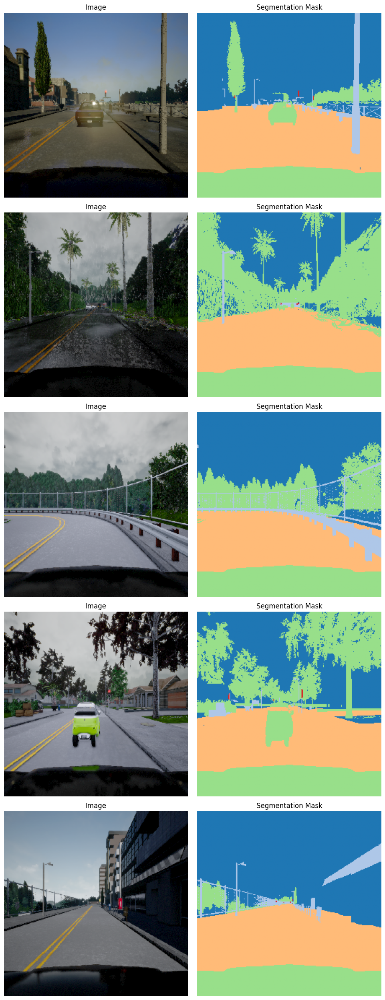

Epoch 1/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.17it/s]


Epoch 1/50 - Train Loss: 0.9763, Train mIoU: 0.5427, Val Loss: 0.4610, Val mIoU: 0.6621


Epoch 2/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  8.74it/s]


Epoch 2/50 - Train Loss: 0.3847, Train mIoU: 0.7051, Val Loss: 0.3300, Val mIoU: 0.7356


Epoch 3/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  8.70it/s]


Epoch 3/50 - Train Loss: 0.3287, Train mIoU: 0.7232, Val Loss: 0.3259, Val mIoU: 0.7191


Epoch 4/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  8.58it/s]


Epoch 4/50 - Train Loss: 0.3033, Train mIoU: 0.7389, Val Loss: 0.2798, Val mIoU: 0.7552


Epoch 5/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  8.88it/s]


Epoch 5/50 - Train Loss: 0.2637, Train mIoU: 0.7679, Val Loss: 0.2485, Val mIoU: 0.7795


Epoch 6/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  8.46it/s]


Epoch 6/50 - Train Loss: 0.2368, Train mIoU: 0.7920, Val Loss: 0.2227, Val mIoU: 0.8077


Epoch 7/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.12it/s]


Epoch 7/50 - Train Loss: 0.2176, Train mIoU: 0.8106, Val Loss: 0.2092, Val mIoU: 0.8254


Epoch 8/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  8.56it/s]


Epoch 8/50 - Train Loss: 0.2023, Train mIoU: 0.8253, Val Loss: 0.1902, Val mIoU: 0.8397


Epoch 9/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  8.54it/s]


Epoch 9/50 - Train Loss: 0.1858, Train mIoU: 0.8385, Val Loss: 0.1831, Val mIoU: 0.8401


Epoch 10/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  8.56it/s]


Epoch 10/50 - Train Loss: 0.1688, Train mIoU: 0.8523, Val Loss: 0.1694, Val mIoU: 0.8535


Epoch 11/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  8.77it/s]


Epoch 11/50 - Train Loss: 0.1539, Train mIoU: 0.8641, Val Loss: 0.1551, Val mIoU: 0.8617


Epoch 12/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  8.58it/s]


Epoch 12/50 - Train Loss: 0.1435, Train mIoU: 0.8715, Val Loss: 0.1407, Val mIoU: 0.8767


Epoch 13/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  8.56it/s]


Epoch 13/50 - Train Loss: 0.1330, Train mIoU: 0.8809, Val Loss: 0.1312, Val mIoU: 0.8864


Epoch 14/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  8.58it/s]


Epoch 14/50 - Train Loss: 0.1233, Train mIoU: 0.8888, Val Loss: 0.1278, Val mIoU: 0.8859


Epoch 15/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  8.60it/s]


Epoch 15/50 - Train Loss: 0.1167, Train mIoU: 0.8953, Val Loss: 0.1205, Val mIoU: 0.8936


Epoch 16/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  8.59it/s]


Epoch 16/50 - Train Loss: 0.1103, Train mIoU: 0.9014, Val Loss: 0.1202, Val mIoU: 0.9013


Epoch 17/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  8.54it/s]


Epoch 17/50 - Train Loss: 0.1060, Train mIoU: 0.9051, Val Loss: 0.1127, Val mIoU: 0.9028


Epoch 18/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  8.84it/s]


Epoch 18/50 - Train Loss: 0.1024, Train mIoU: 0.9086, Val Loss: 0.1117, Val mIoU: 0.9035


Epoch 19/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  8.52it/s]


Epoch 19/50 - Train Loss: 0.0954, Train mIoU: 0.9152, Val Loss: 0.1005, Val mIoU: 0.9146


Epoch 20/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.10it/s]


Epoch 20/50 - Train Loss: 0.0888, Train mIoU: 0.9205, Val Loss: 0.0974, Val mIoU: 0.9169


Epoch 21/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  8.85it/s]


Epoch 21/50 - Train Loss: 0.0901, Train mIoU: 0.9201, Val Loss: 0.0947, Val mIoU: 0.9195


Epoch 22/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  8.58it/s]


Epoch 22/50 - Train Loss: 0.0838, Train mIoU: 0.9263, Val Loss: 0.0925, Val mIoU: 0.9200


Epoch 23/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  8.71it/s]


Epoch 23/50 - Train Loss: 0.0808, Train mIoU: 0.9286, Val Loss: 0.0904, Val mIoU: 0.9219


Epoch 24/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  8.49it/s]


Epoch 24/50 - Train Loss: 0.0756, Train mIoU: 0.9324, Val Loss: 0.0847, Val mIoU: 0.9260


Epoch 25/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  8.60it/s]


Epoch 25/50 - Train Loss: 0.0728, Train mIoU: 0.9354, Val Loss: 0.0869, Val mIoU: 0.9240


Epoch 26/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  8.73it/s]


Epoch 26/50 - Train Loss: 0.0704, Train mIoU: 0.9368, Val Loss: 0.0835, Val mIoU: 0.9274


Epoch 27/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  8.90it/s]


Epoch 27/50 - Train Loss: 0.0690, Train mIoU: 0.9381, Val Loss: 0.0818, Val mIoU: 0.9282


Epoch 28/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  8.62it/s]


Epoch 28/50 - Train Loss: 0.0659, Train mIoU: 0.9414, Val Loss: 0.0792, Val mIoU: 0.9320


Epoch 29/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  8.54it/s]


Epoch 29/50 - Train Loss: 0.0645, Train mIoU: 0.9417, Val Loss: 0.0805, Val mIoU: 0.9299


Epoch 30/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  8.60it/s]


Epoch 30/50 - Train Loss: 0.0620, Train mIoU: 0.9445, Val Loss: 0.0782, Val mIoU: 0.9328


Epoch 31/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  8.56it/s]


Epoch 31/50 - Train Loss: 0.0608, Train mIoU: 0.9458, Val Loss: 0.0793, Val mIoU: 0.9302


Epoch 32/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  8.52it/s]


Epoch 32/50 - Train Loss: 0.0591, Train mIoU: 0.9471, Val Loss: 0.0753, Val mIoU: 0.9354


Epoch 33/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  8.89it/s]


Epoch 33/50 - Train Loss: 0.0583, Train mIoU: 0.9478, Val Loss: 0.0772, Val mIoU: 0.9338


Epoch 34/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  8.61it/s]


Epoch 34/50 - Train Loss: 0.0566, Train mIoU: 0.9493, Val Loss: 0.0740, Val mIoU: 0.9367


Epoch 35/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  8.52it/s]


Epoch 35/50 - Train Loss: 0.0544, Train mIoU: 0.9513, Val Loss: 0.0725, Val mIoU: 0.9382


Epoch 36/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  8.78it/s]


Epoch 36/50 - Train Loss: 0.0542, Train mIoU: 0.9521, Val Loss: 0.0727, Val mIoU: 0.9388


Epoch 37/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.24it/s]


Epoch 37/50 - Train Loss: 0.0517, Train mIoU: 0.9535, Val Loss: 0.0686, Val mIoU: 0.9417


Epoch 38/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  8.52it/s]


Epoch 38/50 - Train Loss: 0.0527, Train mIoU: 0.9535, Val Loss: 0.0708, Val mIoU: 0.9388


Epoch 39/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  8.69it/s]


Epoch 39/50 - Train Loss: 0.0514, Train mIoU: 0.9543, Val Loss: 0.0700, Val mIoU: 0.9392


Epoch 40/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  8.56it/s]


Epoch 40/50 - Train Loss: 0.0487, Train mIoU: 0.9568, Val Loss: 0.0676, Val mIoU: 0.9418


Epoch 41/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  8.79it/s]


Epoch 41/50 - Train Loss: 0.0472, Train mIoU: 0.9584, Val Loss: 0.0658, Val mIoU: 0.9449


Epoch 42/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  8.50it/s]


Epoch 42/50 - Train Loss: 0.0469, Train mIoU: 0.9584, Val Loss: 0.0674, Val mIoU: 0.9439


Epoch 43/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  8.77it/s]


Epoch 43/50 - Train Loss: 0.0446, Train mIoU: 0.9608, Val Loss: 0.0648, Val mIoU: 0.9449


Epoch 44/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  8.48it/s]


Epoch 44/50 - Train Loss: 0.0444, Train mIoU: 0.9610, Val Loss: 0.0665, Val mIoU: 0.9426


Epoch 45/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  8.93it/s]


Epoch 45/50 - Train Loss: 0.0441, Train mIoU: 0.9605, Val Loss: 0.0687, Val mIoU: 0.9424


Epoch 46/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  8.60it/s]


Epoch 46/50 - Train Loss: 0.0431, Train mIoU: 0.9615, Val Loss: 0.0663, Val mIoU: 0.9458


Epoch 47/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  8.82it/s]


Epoch 47/50 - Train Loss: 0.0427, Train mIoU: 0.9625, Val Loss: 0.0662, Val mIoU: 0.9434


Epoch 48/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  8.85it/s]


Epoch 48/50 - Train Loss: 0.0422, Train mIoU: 0.9627, Val Loss: 0.0621, Val mIoU: 0.9492


Epoch 49/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  8.68it/s]


Epoch 49/50 - Train Loss: 0.0396, Train mIoU: 0.9651, Val Loss: 0.0669, Val mIoU: 0.9466


Epoch 50/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  8.87it/s]


Epoch 50/50 - Train Loss: 0.0387, Train mIoU: 0.9661, Val Loss: 0.0626, Val mIoU: 0.9495


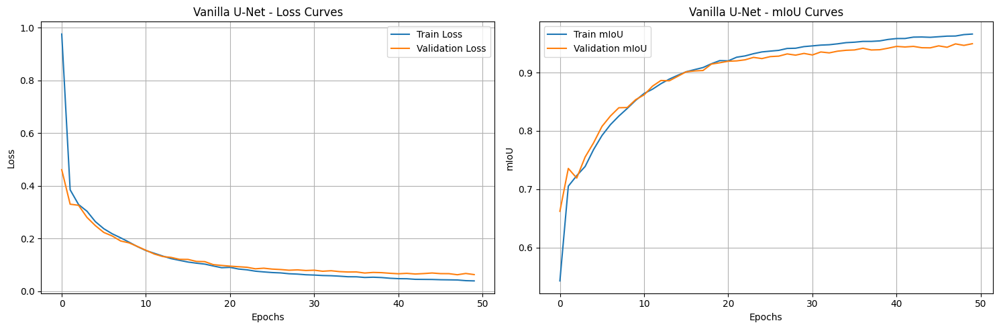

Evaluating: 100%|██████████| 63/63 [00:13<00:00,  4.55it/s]


Test mIoU: 0.9457


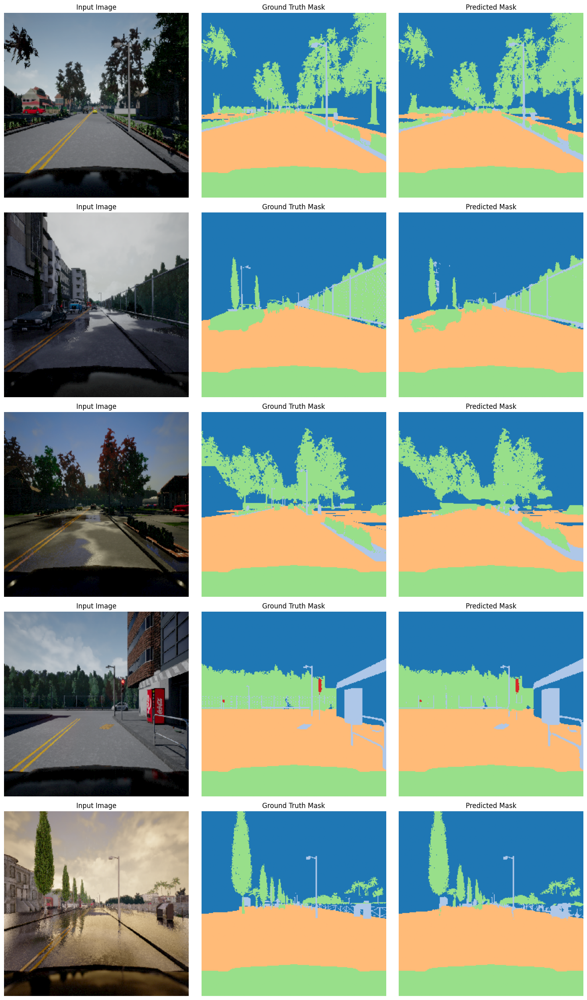

Training U-Net without Skip Connections...


Epoch 1/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.90it/s]


Epoch 1/50 - Train Loss: 1.3282, Train mIoU: 0.0485, Val Loss: 0.9632, Val mIoU: 0.1151


Epoch 2/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.49it/s]


Epoch 2/50 - Train Loss: 0.6405, Train mIoU: 0.4848, Val Loss: 0.4434, Val mIoU: 0.6452


Epoch 3/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.89it/s]


Epoch 3/50 - Train Loss: 0.3861, Train mIoU: 0.6422, Val Loss: 0.3527, Val mIoU: 0.6968


Epoch 4/50 - Validation: 100%|██████████| 50/50 [00:04<00:00, 10.04it/s]


Epoch 4/50 - Train Loss: 0.3386, Train mIoU: 0.6926, Val Loss: 0.3034, Val mIoU: 0.7297


Epoch 5/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.41it/s]


Epoch 5/50 - Train Loss: 0.2861, Train mIoU: 0.7378, Val Loss: 0.2687, Val mIoU: 0.7333


Epoch 6/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.87it/s]


Epoch 6/50 - Train Loss: 0.2628, Train mIoU: 0.7560, Val Loss: 0.2487, Val mIoU: 0.7691


Epoch 7/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.69it/s]


Epoch 7/50 - Train Loss: 0.2412, Train mIoU: 0.7730, Val Loss: 0.2325, Val mIoU: 0.7840


Epoch 8/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.71it/s]


Epoch 8/50 - Train Loss: 0.2213, Train mIoU: 0.7870, Val Loss: 0.2143, Val mIoU: 0.7913


Epoch 9/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.24it/s]


Epoch 9/50 - Train Loss: 0.2092, Train mIoU: 0.7943, Val Loss: 0.1987, Val mIoU: 0.8019


Epoch 10/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.35it/s]


Epoch 10/50 - Train Loss: 0.1919, Train mIoU: 0.8050, Val Loss: 0.1967, Val mIoU: 0.8100


Epoch 11/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.17it/s]


Epoch 11/50 - Train Loss: 0.1834, Train mIoU: 0.8108, Val Loss: 0.1842, Val mIoU: 0.8071


Epoch 12/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.62it/s]


Epoch 12/50 - Train Loss: 0.1734, Train mIoU: 0.8178, Val Loss: 0.1754, Val mIoU: 0.8159


Epoch 13/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.42it/s]


Epoch 13/50 - Train Loss: 0.1641, Train mIoU: 0.8251, Val Loss: 0.1678, Val mIoU: 0.8249


Epoch 14/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.31it/s]


Epoch 14/50 - Train Loss: 0.1602, Train mIoU: 0.8274, Val Loss: 0.1693, Val mIoU: 0.8154


Epoch 15/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.50it/s]


Epoch 15/50 - Train Loss: 0.1516, Train mIoU: 0.8348, Val Loss: 0.1576, Val mIoU: 0.8338


Epoch 16/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.75it/s]


Epoch 16/50 - Train Loss: 0.1678, Train mIoU: 0.8221, Val Loss: 0.1535, Val mIoU: 0.8333


Epoch 17/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.44it/s]


Epoch 17/50 - Train Loss: 0.1400, Train mIoU: 0.8440, Val Loss: 0.1470, Val mIoU: 0.8419


Epoch 18/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.30it/s]


Epoch 18/50 - Train Loss: 0.1346, Train mIoU: 0.8490, Val Loss: 0.1453, Val mIoU: 0.8431


Epoch 19/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.94it/s]


Epoch 19/50 - Train Loss: 0.1308, Train mIoU: 0.8520, Val Loss: 0.1438, Val mIoU: 0.8492


Epoch 20/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.76it/s]


Epoch 20/50 - Train Loss: 0.1265, Train mIoU: 0.8565, Val Loss: 0.1391, Val mIoU: 0.8505


Epoch 21/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.39it/s]


Epoch 21/50 - Train Loss: 0.1232, Train mIoU: 0.8598, Val Loss: 0.1372, Val mIoU: 0.8494


Epoch 22/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.34it/s]


Epoch 22/50 - Train Loss: 0.1198, Train mIoU: 0.8629, Val Loss: 0.1346, Val mIoU: 0.8535


Epoch 23/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.33it/s]


Epoch 23/50 - Train Loss: 0.1170, Train mIoU: 0.8652, Val Loss: 0.1333, Val mIoU: 0.8548


Epoch 24/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.42it/s]


Epoch 24/50 - Train Loss: 0.1149, Train mIoU: 0.8670, Val Loss: 0.1345, Val mIoU: 0.8560


Epoch 25/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.33it/s]


Epoch 25/50 - Train Loss: 0.1116, Train mIoU: 0.8702, Val Loss: 0.1289, Val mIoU: 0.8596


Epoch 26/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.32it/s]


Epoch 26/50 - Train Loss: 0.1093, Train mIoU: 0.8727, Val Loss: 0.1292, Val mIoU: 0.8577


Epoch 27/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.83it/s]


Epoch 27/50 - Train Loss: 0.1067, Train mIoU: 0.8760, Val Loss: 0.1272, Val mIoU: 0.8601


Epoch 28/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.41it/s]


Epoch 28/50 - Train Loss: 0.1048, Train mIoU: 0.8778, Val Loss: 0.1278, Val mIoU: 0.8561


Epoch 29/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.67it/s]


Epoch 29/50 - Train Loss: 0.1046, Train mIoU: 0.8786, Val Loss: 0.1240, Val mIoU: 0.8641


Epoch 30/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.60it/s]


Epoch 30/50 - Train Loss: 0.1034, Train mIoU: 0.8798, Val Loss: 0.1246, Val mIoU: 0.8640


Epoch 31/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.48it/s]


Epoch 31/50 - Train Loss: 0.1002, Train mIoU: 0.8830, Val Loss: 0.1260, Val mIoU: 0.8625


Epoch 32/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.25it/s]


Epoch 32/50 - Train Loss: 0.0989, Train mIoU: 0.8843, Val Loss: 0.1216, Val mIoU: 0.8678


Epoch 33/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.76it/s]


Epoch 33/50 - Train Loss: 0.1002, Train mIoU: 0.8831, Val Loss: 0.1252, Val mIoU: 0.8607


Epoch 34/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.78it/s]


Epoch 34/50 - Train Loss: 0.0977, Train mIoU: 0.8858, Val Loss: 0.1205, Val mIoU: 0.8627


Epoch 35/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.62it/s]


Epoch 35/50 - Train Loss: 0.0951, Train mIoU: 0.8885, Val Loss: 0.1201, Val mIoU: 0.8694


Epoch 36/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.74it/s]


Epoch 36/50 - Train Loss: 0.0940, Train mIoU: 0.8893, Val Loss: 0.1193, Val mIoU: 0.8685


Epoch 37/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.37it/s]


Epoch 37/50 - Train Loss: 0.0940, Train mIoU: 0.8897, Val Loss: 0.1269, Val mIoU: 0.8597


Epoch 38/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.66it/s]


Epoch 38/50 - Train Loss: 0.0924, Train mIoU: 0.8915, Val Loss: 0.1187, Val mIoU: 0.8734


Epoch 39/50 - Validation: 100%|██████████| 50/50 [00:04<00:00, 10.05it/s]


Epoch 39/50 - Train Loss: 0.0902, Train mIoU: 0.8935, Val Loss: 0.1183, Val mIoU: 0.8714


Epoch 40/50 - Validation: 100%|██████████| 50/50 [00:04<00:00, 10.06it/s]


Epoch 40/50 - Train Loss: 0.0891, Train mIoU: 0.8954, Val Loss: 0.1193, Val mIoU: 0.8725


Epoch 41/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.27it/s]


Epoch 41/50 - Train Loss: 0.0885, Train mIoU: 0.8957, Val Loss: 0.1180, Val mIoU: 0.8728


Epoch 42/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.35it/s]


Epoch 42/50 - Train Loss: 0.0889, Train mIoU: 0.8949, Val Loss: 0.1179, Val mIoU: 0.8724


Epoch 43/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.27it/s]


Epoch 43/50 - Train Loss: 0.0885, Train mIoU: 0.8957, Val Loss: 0.1173, Val mIoU: 0.8730


Epoch 44/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.34it/s]


Epoch 44/50 - Train Loss: 0.0861, Train mIoU: 0.8986, Val Loss: 0.1167, Val mIoU: 0.8720


Epoch 45/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.25it/s]


Epoch 45/50 - Train Loss: 0.0902, Train mIoU: 0.8945, Val Loss: 0.1168, Val mIoU: 0.8728


Epoch 46/50 - Validation: 100%|██████████| 50/50 [00:04<00:00, 10.09it/s]


Epoch 46/50 - Train Loss: 0.0847, Train mIoU: 0.8998, Val Loss: 0.1167, Val mIoU: 0.8730


Epoch 47/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.25it/s]


Epoch 47/50 - Train Loss: 0.0838, Train mIoU: 0.9007, Val Loss: 0.1190, Val mIoU: 0.8759


Epoch 48/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.69it/s]


Epoch 48/50 - Train Loss: 0.0830, Train mIoU: 0.9015, Val Loss: 0.1195, Val mIoU: 0.8743


Epoch 49/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.26it/s]


Epoch 49/50 - Train Loss: 0.0831, Train mIoU: 0.9013, Val Loss: 0.1177, Val mIoU: 0.8759


Epoch 50/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  9.42it/s]


Epoch 50/50 - Train Loss: 0.0819, Train mIoU: 0.9021, Val Loss: 0.1188, Val mIoU: 0.8739


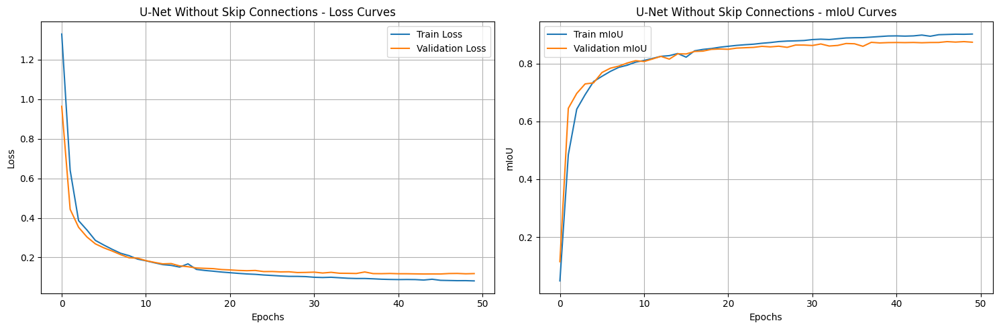

Evaluating: 100%|██████████| 63/63 [00:06<00:00,  9.99it/s]


Test mIoU: 0.8733


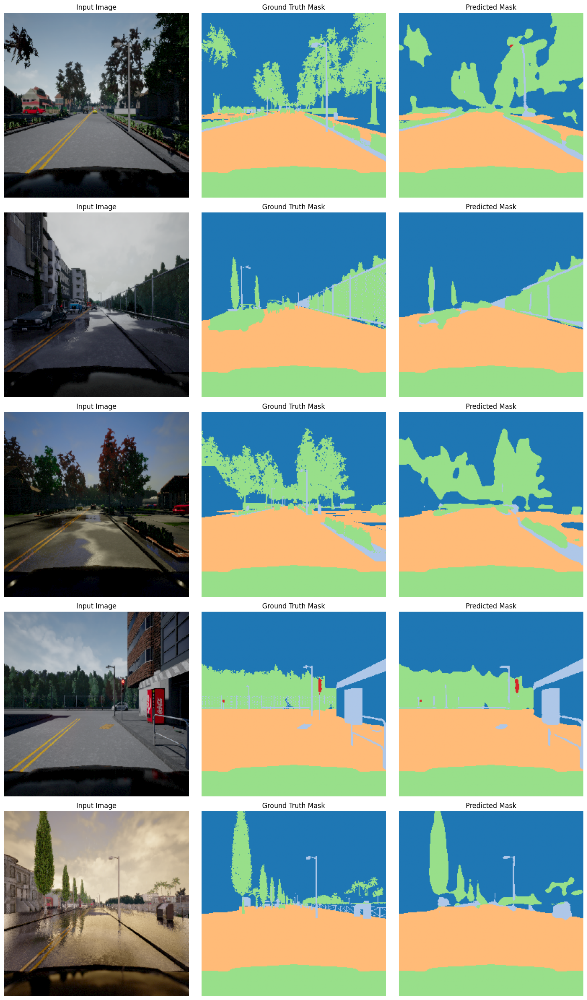

Training Residual U-Net...


Epoch 1/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.99it/s]


Epoch 1/50 - Train Loss: 0.8087, Train mIoU: 0.6051, Val Loss: 0.4459, Val mIoU: 0.6251


Epoch 2/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.95it/s]


Epoch 2/50 - Train Loss: 0.3189, Train mIoU: 0.7427, Val Loss: 0.2838, Val mIoU: 0.7550


Epoch 3/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.94it/s]


Epoch 3/50 - Train Loss: 0.2608, Train mIoU: 0.7771, Val Loss: 0.2543, Val mIoU: 0.7893


Epoch 4/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  8.18it/s]


Epoch 4/50 - Train Loss: 0.2340, Train mIoU: 0.8056, Val Loss: 0.2155, Val mIoU: 0.8292


Epoch 5/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.93it/s]


Epoch 5/50 - Train Loss: 0.2092, Train mIoU: 0.8307, Val Loss: 0.1929, Val mIoU: 0.8480


Epoch 6/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  8.16it/s]


Epoch 6/50 - Train Loss: 0.1912, Train mIoU: 0.8468, Val Loss: 0.1775, Val mIoU: 0.8561


Epoch 7/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  8.21it/s]


Epoch 7/50 - Train Loss: 0.1698, Train mIoU: 0.8610, Val Loss: 0.1643, Val mIoU: 0.8691


Epoch 8/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.95it/s]


Epoch 8/50 - Train Loss: 0.1554, Train mIoU: 0.8705, Val Loss: 0.1568, Val mIoU: 0.8757


Epoch 9/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.87it/s]


Epoch 9/50 - Train Loss: 0.1447, Train mIoU: 0.8767, Val Loss: 0.1479, Val mIoU: 0.8758


Epoch 10/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.97it/s]


Epoch 10/50 - Train Loss: 0.1285, Train mIoU: 0.8895, Val Loss: 0.1314, Val mIoU: 0.8886


Epoch 11/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.95it/s]


Epoch 11/50 - Train Loss: 0.1174, Train mIoU: 0.8981, Val Loss: 0.1208, Val mIoU: 0.8963


Epoch 12/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.88it/s]


Epoch 12/50 - Train Loss: 0.1067, Train mIoU: 0.9060, Val Loss: 0.1074, Val mIoU: 0.9080


Epoch 13/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  8.44it/s]


Epoch 13/50 - Train Loss: 0.0978, Train mIoU: 0.9117, Val Loss: 0.0995, Val mIoU: 0.9132


Epoch 14/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.95it/s]


Epoch 14/50 - Train Loss: 0.0929, Train mIoU: 0.9157, Val Loss: 0.0957, Val mIoU: 0.9138


Epoch 15/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  8.25it/s]


Epoch 15/50 - Train Loss: 0.0862, Train mIoU: 0.9216, Val Loss: 0.0928, Val mIoU: 0.9164


Epoch 16/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  8.05it/s]


Epoch 16/50 - Train Loss: 0.0952, Train mIoU: 0.9118, Val Loss: 0.0900, Val mIoU: 0.9196


Epoch 17/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  8.20it/s]


Epoch 17/50 - Train Loss: 0.0783, Train mIoU: 0.9280, Val Loss: 0.0843, Val mIoU: 0.9248


Epoch 18/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  8.07it/s]


Epoch 18/50 - Train Loss: 0.0741, Train mIoU: 0.9327, Val Loss: 0.0803, Val mIoU: 0.9294


Epoch 19/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  8.42it/s]


Epoch 19/50 - Train Loss: 0.0695, Train mIoU: 0.9361, Val Loss: 0.0772, Val mIoU: 0.9326


Epoch 20/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.95it/s]


Epoch 20/50 - Train Loss: 0.0670, Train mIoU: 0.9384, Val Loss: 0.0756, Val mIoU: 0.9332


Epoch 21/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  8.09it/s]


Epoch 21/50 - Train Loss: 0.0639, Train mIoU: 0.9417, Val Loss: 0.0730, Val mIoU: 0.9349


Epoch 22/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.96it/s]


Epoch 22/50 - Train Loss: 0.0620, Train mIoU: 0.9436, Val Loss: 0.0760, Val mIoU: 0.9329


Epoch 23/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  8.01it/s]


Epoch 23/50 - Train Loss: 0.0614, Train mIoU: 0.9439, Val Loss: 0.0695, Val mIoU: 0.9372


Epoch 24/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.88it/s]


Epoch 24/50 - Train Loss: 0.0582, Train mIoU: 0.9468, Val Loss: 0.0671, Val mIoU: 0.9395


Epoch 25/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.97it/s]


Epoch 25/50 - Train Loss: 0.0563, Train mIoU: 0.9484, Val Loss: 0.0749, Val mIoU: 0.9332


Epoch 26/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.93it/s]


Epoch 26/50 - Train Loss: 0.0586, Train mIoU: 0.9465, Val Loss: 0.0654, Val mIoU: 0.9409


Epoch 27/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.95it/s]


Epoch 27/50 - Train Loss: 0.0520, Train mIoU: 0.9526, Val Loss: 0.0644, Val mIoU: 0.9424


Epoch 28/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.96it/s]


Epoch 28/50 - Train Loss: 0.0500, Train mIoU: 0.9544, Val Loss: 0.0653, Val mIoU: 0.9428


Epoch 29/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.93it/s]


Epoch 29/50 - Train Loss: 0.0491, Train mIoU: 0.9554, Val Loss: 0.0619, Val mIoU: 0.9446


Epoch 30/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  8.02it/s]


Epoch 30/50 - Train Loss: 0.0474, Train mIoU: 0.9567, Val Loss: 0.0601, Val mIoU: 0.9470


Epoch 31/50 - Validation: 100%|██████████| 50/50 [00:05<00:00,  8.36it/s]


Epoch 31/50 - Train Loss: 0.0458, Train mIoU: 0.9583, Val Loss: 0.0610, Val mIoU: 0.9464


Epoch 32/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.95it/s]


Epoch 32/50 - Train Loss: 0.0449, Train mIoU: 0.9591, Val Loss: 0.0640, Val mIoU: 0.9450


Epoch 33/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  8.02it/s]


Epoch 33/50 - Train Loss: 0.0448, Train mIoU: 0.9590, Val Loss: 0.0591, Val mIoU: 0.9487


Epoch 34/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.93it/s]


Epoch 34/50 - Train Loss: 0.0428, Train mIoU: 0.9611, Val Loss: 0.0573, Val mIoU: 0.9491


Epoch 35/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.98it/s]


Epoch 35/50 - Train Loss: 0.0411, Train mIoU: 0.9626, Val Loss: 0.0559, Val mIoU: 0.9497


Epoch 36/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.96it/s]


Epoch 36/50 - Train Loss: 0.0397, Train mIoU: 0.9640, Val Loss: 0.0579, Val mIoU: 0.9496


Epoch 37/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  8.00it/s]


Epoch 37/50 - Train Loss: 0.0387, Train mIoU: 0.9648, Val Loss: 0.0580, Val mIoU: 0.9483


Epoch 38/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.95it/s]


Epoch 38/50 - Train Loss: 0.0418, Train mIoU: 0.9615, Val Loss: 0.0550, Val mIoU: 0.9511


Epoch 39/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.93it/s]


Epoch 39/50 - Train Loss: 0.0371, Train mIoU: 0.9661, Val Loss: 0.0543, Val mIoU: 0.9521


Epoch 40/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  8.00it/s]


Epoch 40/50 - Train Loss: 0.0362, Train mIoU: 0.9670, Val Loss: 0.0535, Val mIoU: 0.9537


Epoch 41/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.98it/s]


Epoch 41/50 - Train Loss: 0.0347, Train mIoU: 0.9682, Val Loss: 0.0553, Val mIoU: 0.9518


Epoch 42/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.99it/s]


Epoch 42/50 - Train Loss: 0.0348, Train mIoU: 0.9684, Val Loss: 0.0520, Val mIoU: 0.9549


Epoch 43/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.98it/s]


Epoch 43/50 - Train Loss: 0.0332, Train mIoU: 0.9697, Val Loss: 0.0506, Val mIoU: 0.9549


Epoch 44/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.89it/s]


Epoch 44/50 - Train Loss: 0.0323, Train mIoU: 0.9703, Val Loss: 0.0535, Val mIoU: 0.9533


Epoch 45/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  8.02it/s]


Epoch 45/50 - Train Loss: 0.0320, Train mIoU: 0.9706, Val Loss: 0.0521, Val mIoU: 0.9544


Epoch 46/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  8.21it/s]


Epoch 46/50 - Train Loss: 0.0313, Train mIoU: 0.9712, Val Loss: 0.0519, Val mIoU: 0.9558


Epoch 47/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.93it/s]


Epoch 47/50 - Train Loss: 0.0300, Train mIoU: 0.9724, Val Loss: 0.0503, Val mIoU: 0.9575


Epoch 48/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  8.06it/s]


Epoch 48/50 - Train Loss: 0.0297, Train mIoU: 0.9728, Val Loss: 0.0549, Val mIoU: 0.9518


Epoch 49/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  8.04it/s]


Epoch 49/50 - Train Loss: 0.0588, Train mIoU: 0.9466, Val Loss: 0.0509, Val mIoU: 0.9542


Epoch 50/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  8.27it/s]


Epoch 50/50 - Train Loss: 0.0318, Train mIoU: 0.9707, Val Loss: 0.0484, Val mIoU: 0.9578


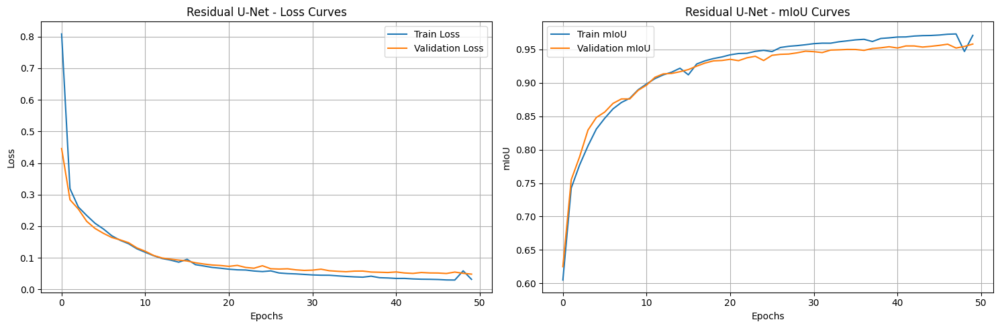

Evaluating: 100%|██████████| 63/63 [00:07<00:00,  8.52it/s]


Test mIoU: 0.9546


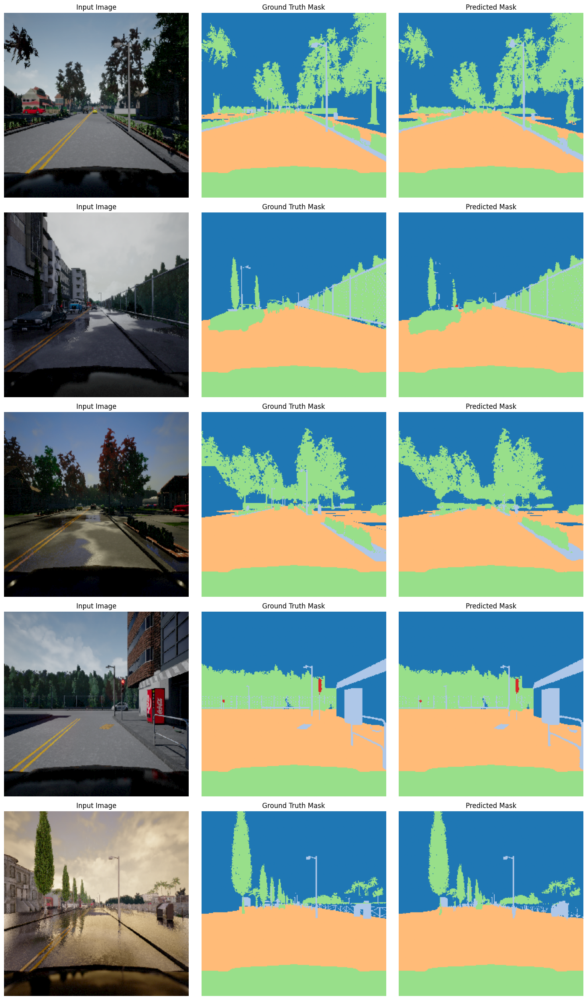

Training Attention U-Net...


Epoch 1/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.35it/s]


Epoch 1/50 - Train Loss: 0.6174, Train mIoU: 0.6774, Val Loss: 0.7175, Val mIoU: 0.6901


Epoch 2/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.72it/s]


Epoch 2/50 - Train Loss: 0.2494, Train mIoU: 0.7741, Val Loss: 0.3840, Val mIoU: 0.7639


Epoch 3/50 - Training:  17%|█▋        | 34/200 [00:09<00:48,  3.45it/s]

In [ ]:
# Example of how to run the code
print(f"Using device: {DEVICE}")
print(f"Starting training on {len(train_data)} training samples and {len(val_data)} validation samples")
print(f"Testing will be performed on {len(test_data)} test samples")

# Choose which model to train
model_choice = input("Choose a model to train (1: Vanilla U-Net, 2: U-Net No Skip, 3: Residual U-Net, 4: Attention U-Net, 5: All): ")

if model_choice == '1':
    train_vanilla_unet()
elif model_choice == '2':
    train_unet_no_skip()
elif model_choice == '3':
    train_residual_unet()
elif model_choice == '4':
    train_attention_unet()
elif model_choice == '5':
    run_all_models()
else:
    print("Invalid choice! Defaulting to Vanilla U-Net")
    train_vanilla_unet()

Using device: cuda
Starting training on 1600 training samples and 400 validation samples
Testing will be performed on 500 test samples


Epoch 1/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.65it/s]


Epoch 1/50 - Train Loss: 0.6386, Train mIoU: 0.6871, Val Loss: 0.3462, Val mIoU: 0.6866


Epoch 2/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.31it/s]


Epoch 2/50 - Train Loss: 0.2468, Train mIoU: 0.7758, Val Loss: 0.2234, Val mIoU: 0.8010


Epoch 3/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.23it/s]


Epoch 3/50 - Train Loss: 0.2110, Train mIoU: 0.8091, Val Loss: 0.2154, Val mIoU: 0.8233


Epoch 4/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.21it/s]


Epoch 4/50 - Train Loss: 0.1857, Train mIoU: 0.8314, Val Loss: 0.2257, Val mIoU: 0.7974


Epoch 5/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.15it/s]


Epoch 5/50 - Train Loss: 0.1682, Train mIoU: 0.8498, Val Loss: 0.1801, Val mIoU: 0.8283


Epoch 6/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.23it/s]


Epoch 6/50 - Train Loss: 0.1488, Train mIoU: 0.8659, Val Loss: 0.1664, Val mIoU: 0.8545


Epoch 7/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.26it/s]


Epoch 7/50 - Train Loss: 0.1330, Train mIoU: 0.8812, Val Loss: 0.1303, Val mIoU: 0.8834


Epoch 8/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.68it/s]


Epoch 8/50 - Train Loss: 0.1194, Train mIoU: 0.8924, Val Loss: 0.1224, Val mIoU: 0.8867


Epoch 9/50 - Validation: 100%|██████████| 50/50 [00:07<00:00,  7.12it/s]


Epoch 9/50 - Train Loss: 0.1108, Train mIoU: 0.8989, Val Loss: 0.1144, Val mIoU: 0.8923


Epoch 10/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.30it/s]


Epoch 10/50 - Train Loss: 0.1017, Train mIoU: 0.9058, Val Loss: 0.1059, Val mIoU: 0.9015


Epoch 11/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.26it/s]


Epoch 11/50 - Train Loss: 0.1100, Train mIoU: 0.8985, Val Loss: 0.1147, Val mIoU: 0.8960


Epoch 12/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.20it/s]


Epoch 12/50 - Train Loss: 0.0950, Train mIoU: 0.9111, Val Loss: 0.1025, Val mIoU: 0.9115


Epoch 13/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.20it/s]


Epoch 13/50 - Train Loss: 0.0836, Train mIoU: 0.9211, Val Loss: 0.0920, Val mIoU: 0.9152


Epoch 14/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.24it/s]


Epoch 14/50 - Train Loss: 0.0802, Train mIoU: 0.9250, Val Loss: 0.0888, Val mIoU: 0.9165


Epoch 15/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.33it/s]


Epoch 15/50 - Train Loss: 0.0762, Train mIoU: 0.9283, Val Loss: 0.0822, Val mIoU: 0.9251


Epoch 16/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.84it/s]


Epoch 16/50 - Train Loss: 0.0728, Train mIoU: 0.9320, Val Loss: 0.0814, Val mIoU: 0.9258


Epoch 17/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.51it/s]


Epoch 17/50 - Train Loss: 0.0679, Train mIoU: 0.9365, Val Loss: 0.0761, Val mIoU: 0.9331


Epoch 18/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.40it/s]


Epoch 18/50 - Train Loss: 0.0661, Train mIoU: 0.9386, Val Loss: 0.0819, Val mIoU: 0.9280


Epoch 19/50 - Validation: 100%|██████████| 50/50 [00:07<00:00,  7.13it/s]


Epoch 19/50 - Train Loss: 0.0637, Train mIoU: 0.9398, Val Loss: 0.0696, Val mIoU: 0.9370


Epoch 20/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.22it/s]


Epoch 20/50 - Train Loss: 0.0611, Train mIoU: 0.9442, Val Loss: 0.0742, Val mIoU: 0.9327


Epoch 21/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.18it/s]


Epoch 21/50 - Train Loss: 0.0594, Train mIoU: 0.9444, Val Loss: 0.0703, Val mIoU: 0.9371


Epoch 22/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.16it/s]


Epoch 22/50 - Train Loss: 0.0571, Train mIoU: 0.9477, Val Loss: 0.0888, Val mIoU: 0.9125


Epoch 23/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.17it/s]


Epoch 23/50 - Train Loss: 0.0588, Train mIoU: 0.9454, Val Loss: 0.0621, Val mIoU: 0.9440


Epoch 24/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.23it/s]


Epoch 24/50 - Train Loss: 0.0524, Train mIoU: 0.9518, Val Loss: 0.0627, Val mIoU: 0.9410


Epoch 25/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.47it/s]


Epoch 25/50 - Train Loss: 0.0489, Train mIoU: 0.9551, Val Loss: 0.0568, Val mIoU: 0.9499


Epoch 26/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.34it/s]


Epoch 26/50 - Train Loss: 0.0469, Train mIoU: 0.9559, Val Loss: 0.0568, Val mIoU: 0.9444


Epoch 27/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.20it/s]


Epoch 27/50 - Train Loss: 0.0457, Train mIoU: 0.9576, Val Loss: 0.0553, Val mIoU: 0.9501


Epoch 28/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.24it/s]


Epoch 28/50 - Train Loss: 0.0446, Train mIoU: 0.9591, Val Loss: 0.0528, Val mIoU: 0.9508


Epoch 29/50 - Validation: 100%|██████████| 50/50 [00:07<00:00,  7.13it/s]


Epoch 29/50 - Train Loss: 0.0443, Train mIoU: 0.9593, Val Loss: 0.0549, Val mIoU: 0.9505


Epoch 30/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.18it/s]


Epoch 30/50 - Train Loss: 0.0426, Train mIoU: 0.9595, Val Loss: 0.0505, Val mIoU: 0.9542


Epoch 31/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.26it/s]


Epoch 31/50 - Train Loss: 0.0634, Train mIoU: 0.9385, Val Loss: 0.0586, Val mIoU: 0.9465


Epoch 32/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.39it/s]


Epoch 32/50 - Train Loss: 0.0423, Train mIoU: 0.9603, Val Loss: 0.0524, Val mIoU: 0.9521


Epoch 33/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.20it/s]


Epoch 33/50 - Train Loss: 0.0381, Train mIoU: 0.9645, Val Loss: 0.0492, Val mIoU: 0.9559


Epoch 34/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.40it/s]


Epoch 34/50 - Train Loss: 0.0371, Train mIoU: 0.9656, Val Loss: 0.0463, Val mIoU: 0.9589


Epoch 35/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.44it/s]


Epoch 35/50 - Train Loss: 0.0344, Train mIoU: 0.9684, Val Loss: 0.0468, Val mIoU: 0.9591


Epoch 36/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.27it/s]


Epoch 36/50 - Train Loss: 0.0330, Train mIoU: 0.9698, Val Loss: 0.0451, Val mIoU: 0.9596


Epoch 37/50 - Validation: 100%|██████████| 50/50 [00:07<00:00,  7.14it/s]


Epoch 37/50 - Train Loss: 0.0336, Train mIoU: 0.9689, Val Loss: 0.0566, Val mIoU: 0.9469


Epoch 38/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.20it/s]


Epoch 38/50 - Train Loss: 0.0341, Train mIoU: 0.9677, Val Loss: 0.0447, Val mIoU: 0.9602


Epoch 39/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.24it/s]


Epoch 39/50 - Train Loss: 0.0330, Train mIoU: 0.9674, Val Loss: 0.0436, Val mIoU: 0.9611


Epoch 40/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.22it/s]


Epoch 40/50 - Train Loss: 0.0308, Train mIoU: 0.9708, Val Loss: 0.0422, Val mIoU: 0.9618


Epoch 41/50 - Validation: 100%|██████████| 50/50 [00:07<00:00,  7.11it/s]


Epoch 41/50 - Train Loss: 0.0293, Train mIoU: 0.9724, Val Loss: 0.0431, Val mIoU: 0.9603


Epoch 42/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.27it/s]


Epoch 42/50 - Train Loss: 0.0282, Train mIoU: 0.9739, Val Loss: 0.0409, Val mIoU: 0.9645


Epoch 43/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.50it/s]


Epoch 43/50 - Train Loss: 0.0271, Train mIoU: 0.9748, Val Loss: 0.0407, Val mIoU: 0.9641


Epoch 44/50 - Validation: 100%|██████████| 50/50 [00:07<00:00,  7.09it/s]


Epoch 44/50 - Train Loss: 0.0324, Train mIoU: 0.9685, Val Loss: 0.0581, Val mIoU: 0.9425


Epoch 45/50 - Validation: 100%|██████████| 50/50 [00:07<00:00,  7.09it/s]


Epoch 45/50 - Train Loss: 0.0493, Train mIoU: 0.9506, Val Loss: 0.0519, Val mIoU: 0.9480


Epoch 46/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.23it/s]


Epoch 46/50 - Train Loss: 0.0309, Train mIoU: 0.9703, Val Loss: 0.0391, Val mIoU: 0.9635


Epoch 47/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.20it/s]


Epoch 47/50 - Train Loss: 0.0259, Train mIoU: 0.9755, Val Loss: 0.0370, Val mIoU: 0.9655


Epoch 48/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.25it/s]


Epoch 48/50 - Train Loss: 0.0247, Train mIoU: 0.9768, Val Loss: 0.0377, Val mIoU: 0.9656


Epoch 49/50 - Validation: 100%|██████████| 50/50 [00:07<00:00,  7.08it/s]


Epoch 49/50 - Train Loss: 0.0236, Train mIoU: 0.9779, Val Loss: 0.0369, Val mIoU: 0.9668


Epoch 50/50 - Validation: 100%|██████████| 50/50 [00:06<00:00,  7.28it/s]


Epoch 50/50 - Train Loss: 0.0235, Train mIoU: 0.9779, Val Loss: 0.0371, Val mIoU: 0.9674


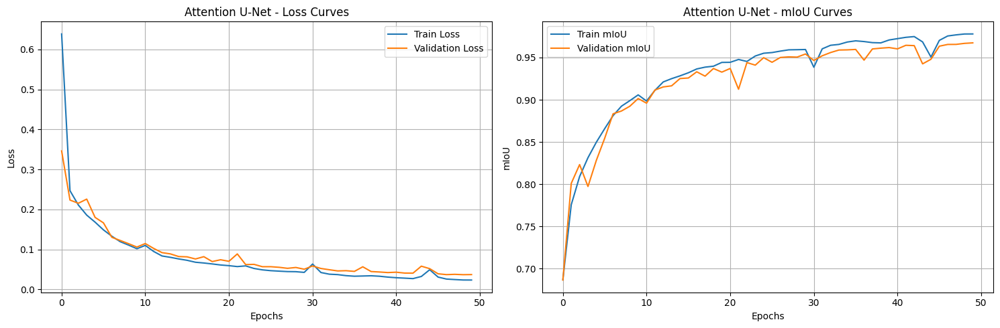

Evaluating: 100%|██████████| 63/63 [00:08<00:00,  7.74it/s]


Test mIoU: 0.9660


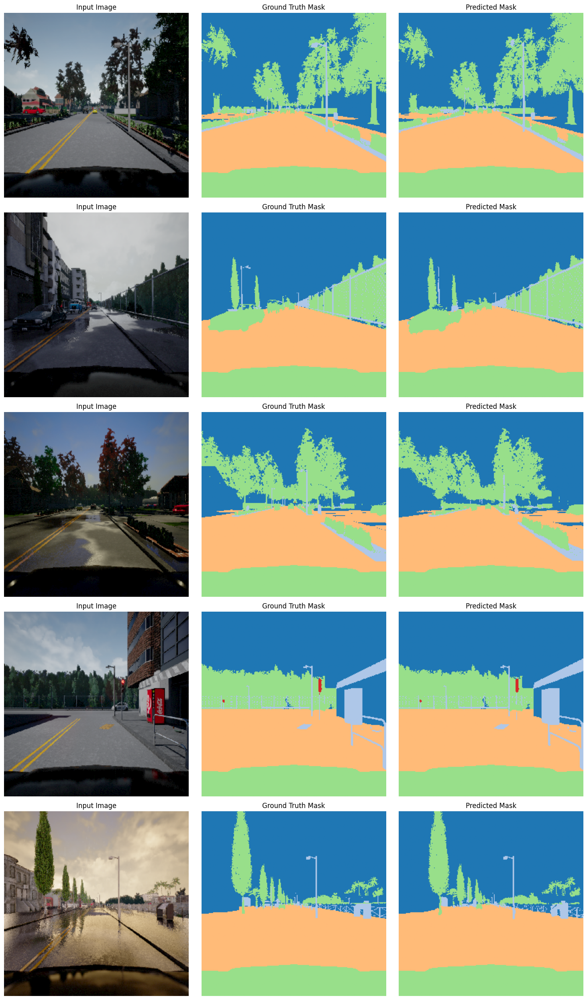

In [16]:
# Example of how to run the code
print(f"Using device: {DEVICE}")
print(f"Starting training on {len(train_data)} training samples and {len(val_data)} validation samples")
print(f"Testing will be performed on {len(test_data)} test samples")

# Choose which model to train
model_choice = input("Choose a model to train (1: Vanilla U-Net, 2: U-Net No Skip, 3: Residual U-Net, 4: Attention U-Net, 5: All): ")

if model_choice == '1':
    train_vanilla_unet()
elif model_choice == '2':
    train_unet_no_skip()
elif model_choice == '3':
    train_residual_unet()
elif model_choice == '4':
    train_attention_unet()
elif model_choice == '5':
    run_all_models()
else:
    print("Invalid choice! Defaulting to Vanilla U-Net")
    train_vanilla_unet()

What differences do you observe in the visualized results compared to the standard U-Net results? Discuss.

The U-Net without skip connections produces more blurry and less detailed segmentation masks with smoother boundaries and loss of fine details. Small objects and thin structures (like poles and traffic signs) are less accurately segmented. The model without skip connections reaches a lower final mIoU (around 0.85-0.90) compared to the Residual U-Net (approximately 0.95-0.97).

Discuss the importance of skip connections in U-Net. Explain their role in U-Net's performance.

Skip connections in U-Net directly connect encoder layers to corresponding decoder layers, preserving spatial information lost during downsampling. These connections allow high-resolution features from early layers to combine with upsampled features, helping recover precise spatial details and boundaries. This is especially important for preserving fine structures and accurately segmenting small objects. Skip connections also help mitigate the vanishing gradient problem during training by providing alternative paths for gradient flow, which enhances model convergence and leads to better overall segmentation performance, as evidenced by the higher mIoU values for models with skip connections.

Model 1 - Vanilla U-Net:

Test mIoU = 0.9457

Model 2 - U-Net without skip Connections

Test mIoU = 0.8733

Model 3 - Residual U-Net

Test mIoU = 0.9546

Model 4 - Attention U-Net

Test mIoU = 0.9660



What are some advantages of using Attention gates as per the paper? How does gating signal at skip connections help in improved performance?

Attention gates selectively highlight important features in skip connections, suppressing irrelevant regions that might add noise to the segmentation. This focused approach helps the model concentrate on relevant structures while reducing feature competition, particularly beneficial for small structures and fine details. The gating signal from the decoder provides contextual information to better guide which features should be emphasized in the skip connections, creating an adaptive mechanism that improves boundary delineation and spatial accuracy.

What differences in results do you observe as compared to the standard U-Net results? Discuss.

The Attention U-Net achieved the highest mIoU (0.9660) compared to Vanilla U-Net (0.9457), demonstrating superior segmentation performance. Visual inspection shows that Attention U-Net produces more precise boundaries and better preserves fine details in complex structures like trees, poles, and small objects, which is critical in driving scenes. The attention mechanism helps filter out irrelevant features that might otherwise cause segmentation artifacts, resulting in cleaner segmentation masks that more closely match the ground truth, especially in areas with multiple object classes or complex boundaries.